# Time series data pattern recognition

This notebook utilized an unsupervised machine learning technique known as time series clustering to identify underlying patterns within the time series data representing Carbon Intensity. The dataset encompassed Carbon Intensity values for each 30-minute Trading Period, spanning from January 1, 2018, 00:00, to December 31, 2022, 23:59.

## Import libraries and setting parameters

In [42]:
# Import needed library
import os
import math
import glob
import datetime as dt
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib import rc
from pylab import rcParams
from itertools import cycle, islice
import numpy as np
import random
import datetime

# Algorithms
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


In [3]:
# Set a seed value for reproducible
seed_value= 12333
os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
rcParams['figure.figsize'] = 14, 8
rcParams['font.size'] = 12

## Loading dataset
The dataset hosted in Github

In [4]:
!wget https://raw.githubusercontent.com/nicknguyen22/Deep_learning/main/Timeseries_pattern_recognition/ci_df18_22.csv

--2023-09-14 00:45:14--  https://raw.githubusercontent.com/nicknguyen22/Deep_learning/main/Timeseries_pattern_recognition/ci_df18_22.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1635753 (1.6M) [text/plain]
Saving to: ‘ci_df18_22.csv’

ci_df18_22.csv      100%[===================>]   1.56M  --.-KB/s    in 0.05s   

2023-09-14 00:45:15 (28.7 MB/s) - ‘ci_df18_22.csv’ saved [1635753/1635753]



In [5]:
df = pd.read_csv('ci_df18_22.csv')
df['Trading_Date'] = pd.to_datetime(df['Trading_Date'])
df.head()

,Trading_Date,01,02,03,04,05,06,07,08,09,...,39,40,41,42,43,44,45,46,47,48
0,2018-01-01,198.103951,198.271681,195.756033,192.970175,187.776190,193.186330,194.141606,178.283152,176.970374,...,167.576227,170.253116,172.610103,173.970336,178.173881,180.476936,184.422992,190.207861,194.233774,198.298962
1,2018-01-02,192.008431,187.030338,188.918792,185.065944,183.883579,180.528327,175.329566,167.163424,166.772907,...,164.623286,167.332896,168.195383,167.882137,167.801551,169.204461,166.193988,168.873691,175.382876,188.988944
2,2018-01-03,179.395525,174.642282,171.957731,164.163738,164.875771,162.963804,161.234228,140.443690,138.990389,...,155.304227,158.325983,165.932140,163.570939,163.578966,159.002037,164.250291,175.408747,178.914236,186.445902
3,2018-01-04,187.569537,182.512983,178.492486,177.810599,170.479568,173.655638,169.720287,158.580197,153.698041,...,161.316655,154.158259,151.764100,149.757583,147.509014,165.210615,147.790157,156.151846,160.034390,152.499745
4,2018-01-05,135.368369,132.122528,125.527408,125.178480,123.904795,122.243919,119.869397,111.190391,109.797237,...,149.833317,145.767679,143.686859,144.227013,144.965878,139.119844,159.419222,170.597745,170.148321,162.883996


## Processing dataset for modeling


In [6]:
# Trading Period to Time
# Columns' name
tp_time = {
    1:'00:00',  2:'00:30', 3:'01:00', 4:'01:30',
    5:'02:00',  6:'02:30', 7:'03:00', 8:'03:30',
    9:'04:00',  10:'04:30',11:'05:00', 12:'05:30',
    13:'06:00', 14:'06:30',15:'07:00', 16:'07:30',
    17:'08:00', 18:'08:30',19:'09:00', 20:'09:30',
    21:'10:00', 22:'10:30',23:'11:00', 24:'11:30',
    25:'12:00', 26:'12:30',27:'13:00', 28:'13:30',
    29:'14:00', 30:'14:30',31:'15:00', 32:'15:30',
    33:'16:00', 34:'16:30',35:'17:00', 36:'17:30',
    37:'18:00', 38:'18:30',39:'19:00', 40:'19:30',
    41:'20:00', 42:'20:30',43:'21:00', 44:'21:30',
    45:'22:00', 46:'22:30',47:'23:00', 48:'23:30'
}

The current dataframe is in wide format which is not suitable for modeling, therefore we need to convert them to long dataframe. The dataset was then divided into five annual datasets for closer examination of yearly patterns.
Additionally, all instances of TP49 and TP50 carbon intensity values were removed, as these values occurred only once per year and might interfere with pattern clustering in later stages

In [7]:
# Convert wide dataframe to long dataframe
df18_22long = pd.melt(df,id_vars=['Trading_Date'], var_name= 'Trading_Period', value_name='CI(g/KWh)')
df18_22long['Trading_Period'] = df18_22long['Trading_Period'].astype(int)
df18_22long['Trading_Period'] = df18_22long['Trading_Period'].replace(tp_time)
df18_22long = df18_22long.sort_values(['Trading_Date','Trading_Period'])
df18_22long = df18_22long.reset_index(drop=True)

In [8]:
# list of output dataframe
dfname_list = []

# split the dataframe to 10 sub-sets of workingdays and holidays of each year
for year in df18_22long['Trading_Date'].dt.year.unique():
    locals()['df'+str(year)]= df18_22long[(df18_22long['Trading_Date'].dt.year == year)].copy()
    dfname_list.append('df'+str(year))

df2018_2022 = df18_22long.copy()
dfname_list.append('df2018_2022')

dfname_list

['df2018', 'df2019', 'df2020', 'df2021', 'df2022', 'df2018_2022']

In [9]:
# Convert dataframes to sets of series for clustering
for name in dfname_list:
    dftemp = globals()[name]
    locals()[name+'_srs'] = []
    locals()[name+'_names'] = []
    for dt in dftemp['Trading_Date'].unique():
        df = dftemp.loc[dftemp['Trading_Date']==dt,['Trading_Period','CI(g/KWh)']]
        df.set_index('Trading_Period',inplace=True)
        locals()[name+'_srs'].append(df)
        locals()[name+'_names'].append(np.datetime_as_string(dt,unit='D'))


In [10]:
# Defining functions to process data for modelling

# Function to normalise time series
def normaliser(series_name):
    tsrs = globals()[series_name+'_srs']
    for i in range(len(tsrs)):
        scaler = MinMaxScaler()
        tsrs[i] = MinMaxScaler().fit_transform(tsrs[i])
        tsrs[i]= tsrs[i].reshape(len(tsrs[i]))


# Function to perform Principal Component Analysis
def series_pca(series_name,nnum):
    pca = PCA(n_components=nnum)
    series = globals()[series_name+'_srs']
    globals()[series_name +'_pca'] = pca.fit_transform(series)

Normalisation is crucial in our analysis as it ensures fair treatment of similar days by correcting differences in feature scales in high-dimensional datasets that may affect the accuracy of clustering.

In [11]:
# Normalising all the series
for series_name in dfname_list:
    normaliser(series_name)

Our series presents 48-dimensional data, which may cause the Curse of Dimensionality,so we employ Principal Component Analysis (PCA) to reduce the
dataset's dimensionality while retaining as much information as possible.

Before we perform the PCA, we need to define the number of components by method as follow

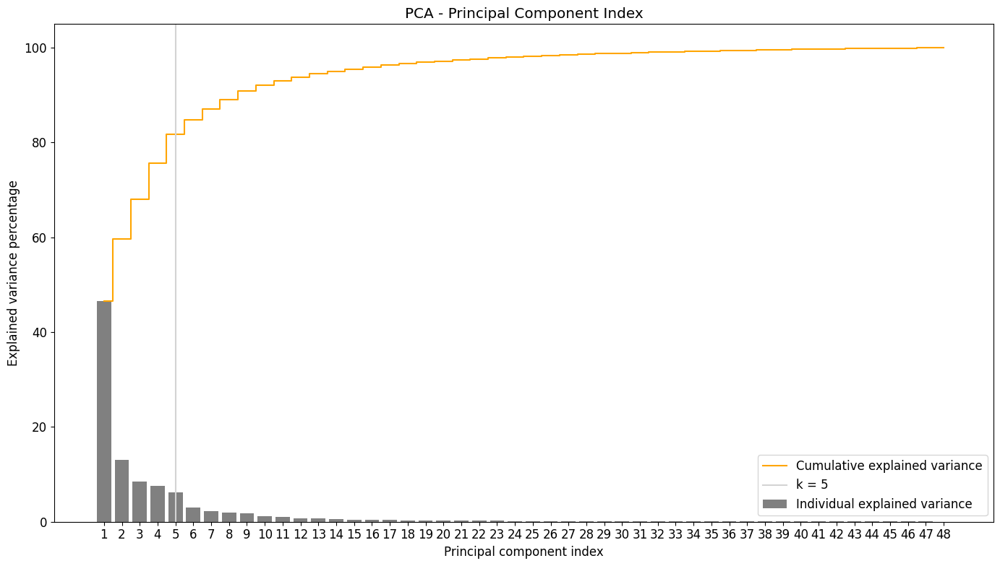

In [12]:
n_pca = PCA(n_components=None)
n_pca.fit(df2018_2022_srs)

exp_var = n_pca.explained_variance_ratio_ * 100
cum_exp_var = np.cumsum(exp_var)
plt.bar(range(1, 49), exp_var, align='center',
        label='Individual explained variance', color = 'gray')

plt.step(range(1, 49), cum_exp_var, where='mid',
         label='Cumulative explained variance', color='orange')
plt.ylabel('Explained variance percentage')
plt.xlabel('Principal component index')
plt.xticks(ticks=range(1,49))
plt.axvline(x = 5, color = 'lightgray', label = 'k = 5')
plt.legend(loc='best')
plt.title('PCA - Principal Component Index')
plt.tight_layout()
plt.show()

From the result above, we perform PCA with number of components of 5

In [13]:
# PCA all the series
for series_name in dfname_list:
    series_pca(series_name,5)

## Pattern recognition with K-mean clustering

K-Means is a widely used clustering algorithm that partitions data points into a predetermined number of clusters (k) by iteratively refining the cluster centroids and reassigning data points to the closest centroid. The process terminates when there is no further change in the assignment of data points to clusters. To identify the optimal number of clusters (k), we employed the Elbow Method, which calculates the Within-Cluster-Sum ofSquared Errors (WSS) for various values of k and selects the k at which the WSS starts todecrease and forms an elbow shape on the WSS vs k plot.

In [14]:
# Compute optimal k for K-means clustering

# Function returns WSS score for k values from 1 to kmax
def calculate_WSS(points, kmax):
  sse = []
  for k in range(1, kmax+1):
    kmeans = KMeans(n_clusters = k).fit(points)
    centroids = kmeans.cluster_centers_
    pred_clusters = kmeans.predict(points)
    curr_sse = 0

    # calculate square of Euclidean distance of each point from its cluster center and add to current WSS
    for i in range(len(points)):
      curr_center = centroids[pred_clusters[i]]
      curr_sse += (points[i, 0] - curr_center[0]) ** 2 + (points[i, 1] - curr_center[1]) ** 2

    sse.append(curr_sse)
  return sse

In [15]:
# Compute wss for yearly dataset and 5 year dataset
import warnings
warnings.filterwarnings('ignore')

k_max = 15 # Maximum number of clusters
yearly_k = calculate_WSS(df2022_pca, k_max)
five_year_k = calculate_WSS(df2018_2022_pca, k_max)

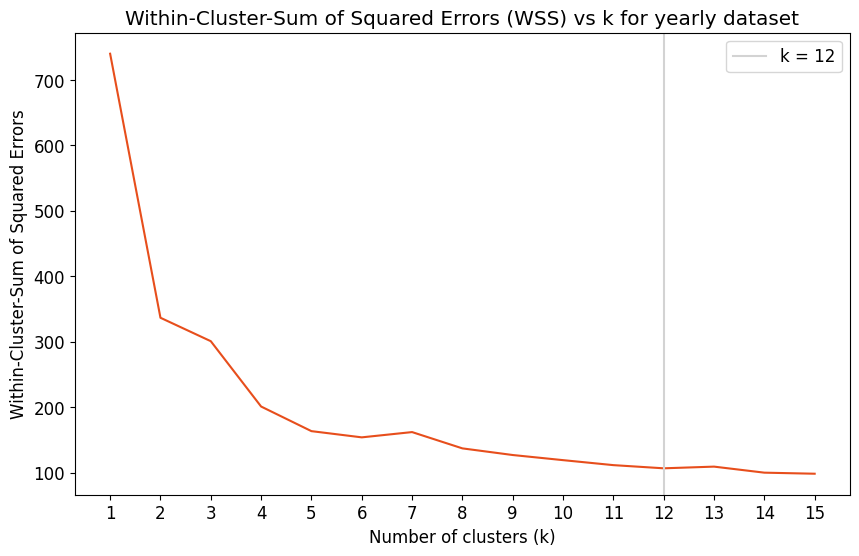

In [16]:
# Plot k chart for yearly dataset
plt.rcParams["figure.figsize"] = (10,6)
k_val = list(range(1,16))
plt.plot(k_val,yearly_k, c='#E74E1C')
plt.xticks(np.arange(min(k_val), max(k_val)+1, 1.0))
plt.axvline(x = 12, color = 'lightgray', label = 'k = 12')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within-Cluster-Sum of Squared Errors')
plt.title('Within-Cluster-Sum of Squared Errors (WSS) vs k for yearly dataset')
plt.legend(loc='best')
plt.show()

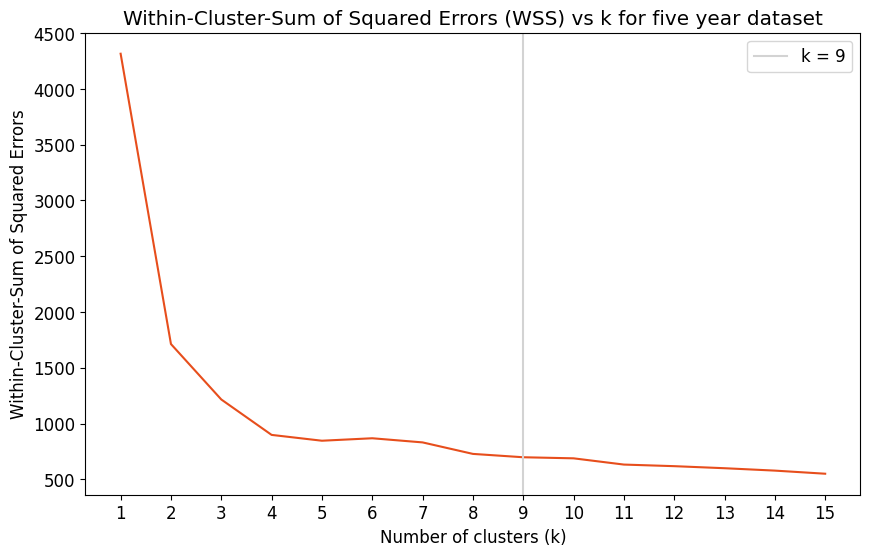

In [17]:
# Plot k chart for five yearly dataset
k_val = list(range(1,16))
plt.rcParams["figure.figsize"] = (10,6)
plt.plot(k_val,five_year_k,c='#E74E1C')
plt.xticks(np.arange(min(k_val), max(k_val)+1, 1.0))
plt.axvline(x = 9, color = 'lightgray', label = 'k = 9')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within-Cluster-Sum of Squared Errors')
plt.title('Within-Cluster-Sum of Squared Errors (WSS) vs k for five year dataset')
plt.legend(loc='best')
plt.show()

In [18]:
# Setting parameters for K-Means Clustering

cluster_yr = 12
cluster_fyrs = 9

kmeans_yr = KMeans(n_clusters=cluster_yr,max_iter=50000)
kmeans_fyrs = KMeans(n_clusters=cluster_fyrs,max_iter=50000)

In [19]:
# Fitting the data to model

# 2022
labels_2022 = kmeans_yr.fit_predict(df2022_pca)
# 2021
labels_2021 = kmeans_yr.fit_predict(df2021_pca)
# 2020
labels_2020 = kmeans_yr.fit_predict(df2020_pca)
# 2019
labels_2019 = kmeans_yr.fit_predict(df2019_pca)
# 2018
labels_2018 = kmeans_yr.fit_predict(df2018_pca)
# 2018 - 2022
labels_2018_2022 = kmeans_fyrs.fit_predict(df2018_2022_pca)

## Visulisation the results

In [20]:
# Defining functions for visualisation

# Function to count the cluster distribution
def countCluster(labels):
    clust,counts = np.unique(labels, return_counts=True)
    count_dict = dict(zip(clust,counts))
    count_dict = {f'Cluster {clust}': count for clust, count in count_dict.items()}
    count_dict = sorted(count_dict.items(), key=lambda x:x[1], reverse=True)
    return count_dict

# Function displays the corresponding cluster for each day
def detail_tbl(df_series_name,df_series_label):
    c_labels = [f"Cluster {label}" for label in df_series_label]
    df = (pd.DataFrame(zip(df_series_name,c_labels),columns=["Series","Cluster"])
            .sort_values(by="Cluster").set_index("Series"))
    return df

# Clusters plot
def plot_cluster(df_series,df_series_label):
    plot_count = 2 # Number of plot per row
    plt.rcParams["figure.figsize"] = (18,18)
    row_num = math.ceil(len(countCluster(df_series_label))/plot_count)
    fig, axs = plt.subplots(row_num,plot_count,figsize=(25,25))
    plt.setp(axs, xticks=np.arange(0, 48+1, 4.0),yticks=([]))
    fig.suptitle('Clusters')
    row_i=0
    column_j=0
    plt.subplots_adjust(wspace=0.08)
    for label in set(df_series_label):
        cluster = []
        for i in range(len(df_series_label)):
                if(df_series_label[i]==label):
                    axs[row_i, column_j].plot(df_series[i],c='gray',alpha=0.3)
                    cluster.append(df_series[i])
        if len(cluster) > 0:
            axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),linewidth=3, c='#E74E1C')
        axs[row_i, column_j].set_title("Cluster "+str(row_i*plot_count+column_j)+  "    " +
            str(np.count_nonzero(df_series_label == row_i*plot_count+column_j)) +" days have this pattern")
        column_j+=1
        if column_j%plot_count == 0:
            row_i+=1
            column_j=0

    plt.show()

# Cluster distribution plot
def plot_c_distr(df_series_label):
    cluster_num = len(countCluster(df_series_label))
    cluster_c = [len(df_series_label[df_series_label==i]) for i in range(cluster_num)]
    cluster_n = ["Cluster "+str(i) for i in range(cluster_num)]
    plt.rcParams["figure.figsize"] = (18,7)
    fig, ax = plt.subplots()
    ax.grid(axis='y',color = 'lightgray', linestyle = '--', linewidth = 0.5)
    plt.title("Cluster Distribution")
    c1 = ax.bar(cluster_n,cluster_c, color = '#EFA246')
    ax.bar_label(c1,padding=3)
    plt.ylabel("Number of classified days")
    plt.show()


### Year 2022 Clustering Visualisation


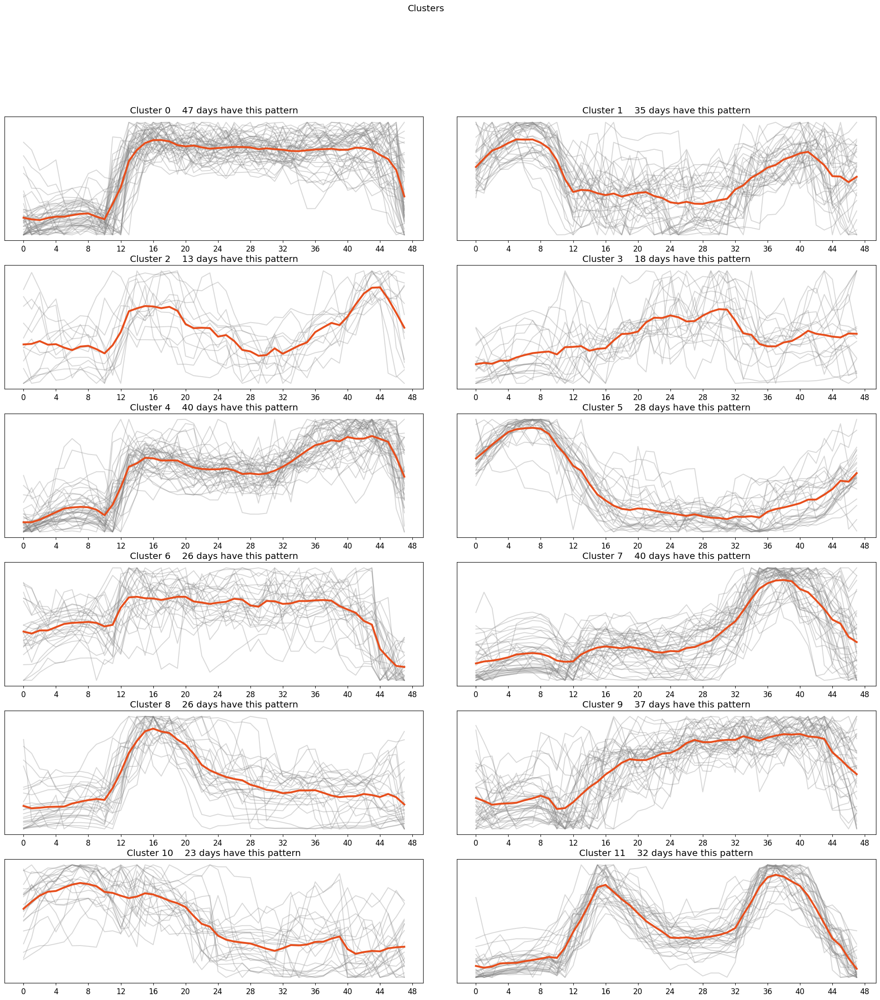

In [21]:
plot_cluster(df2022_srs,labels_2022)

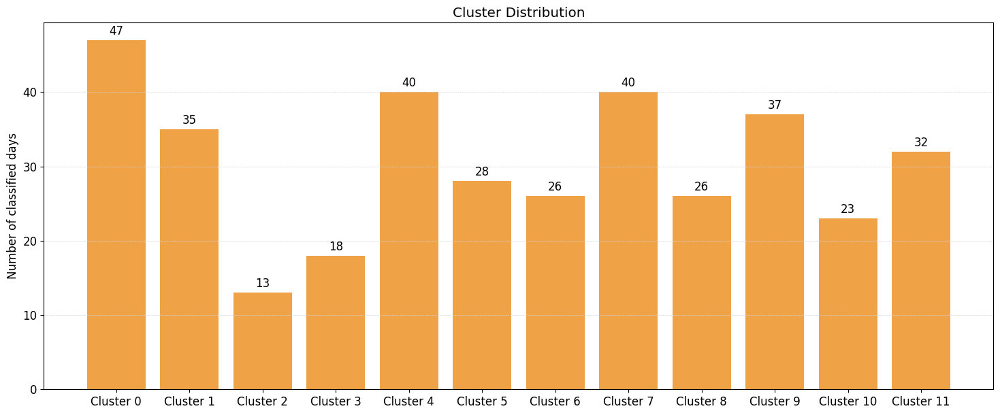

In [22]:
plot_c_distr(labels_2022)

### Year 2021 Clustering Visualisation

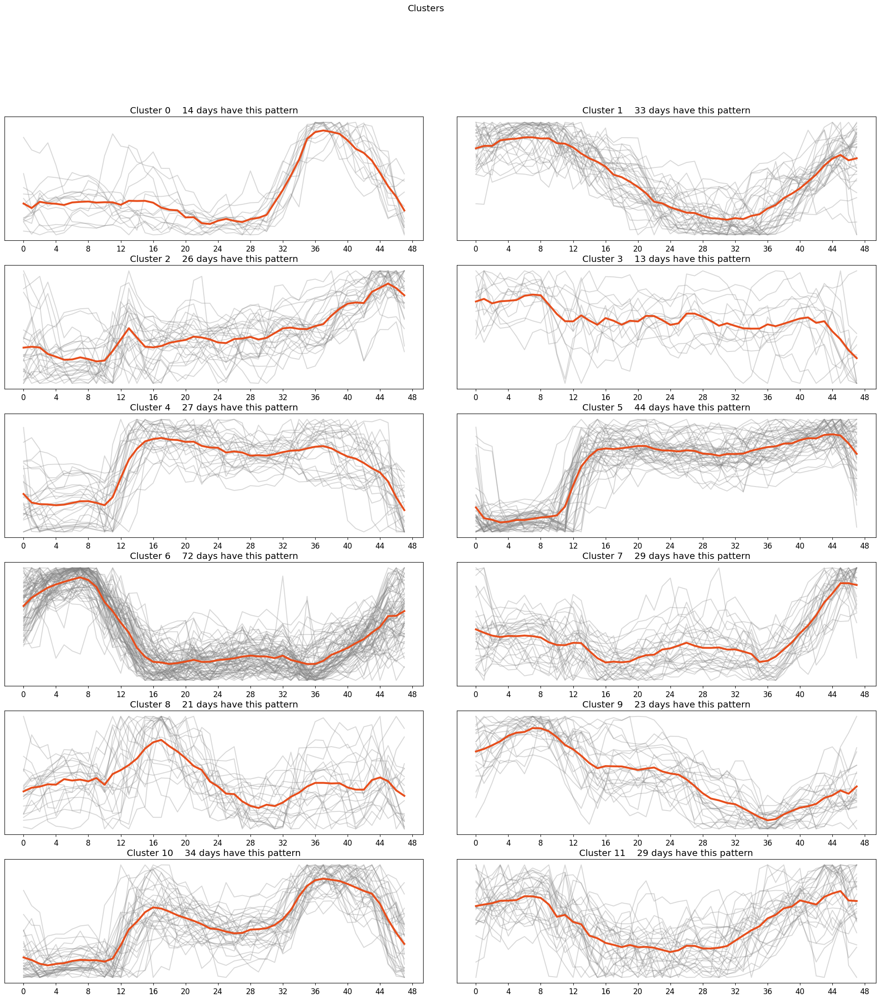

In [23]:
plot_cluster(df2021_srs,labels_2021)

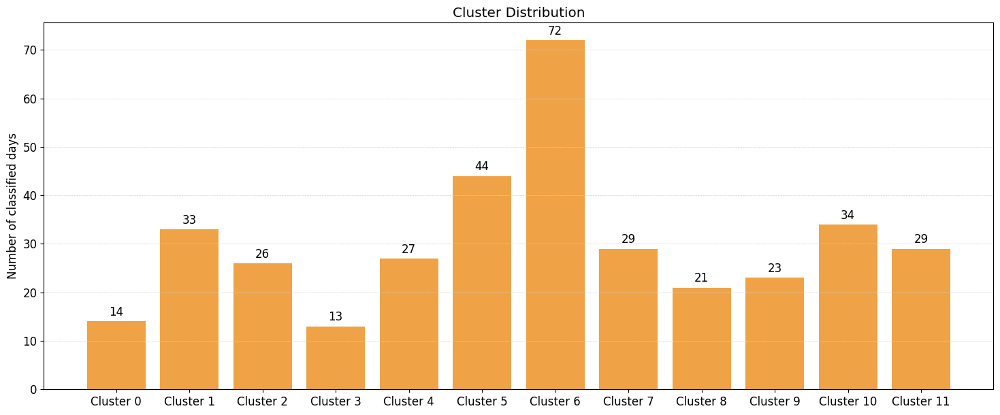

In [24]:
plot_c_distr(labels_2021)

### Year 2020 Clustering Visualisation

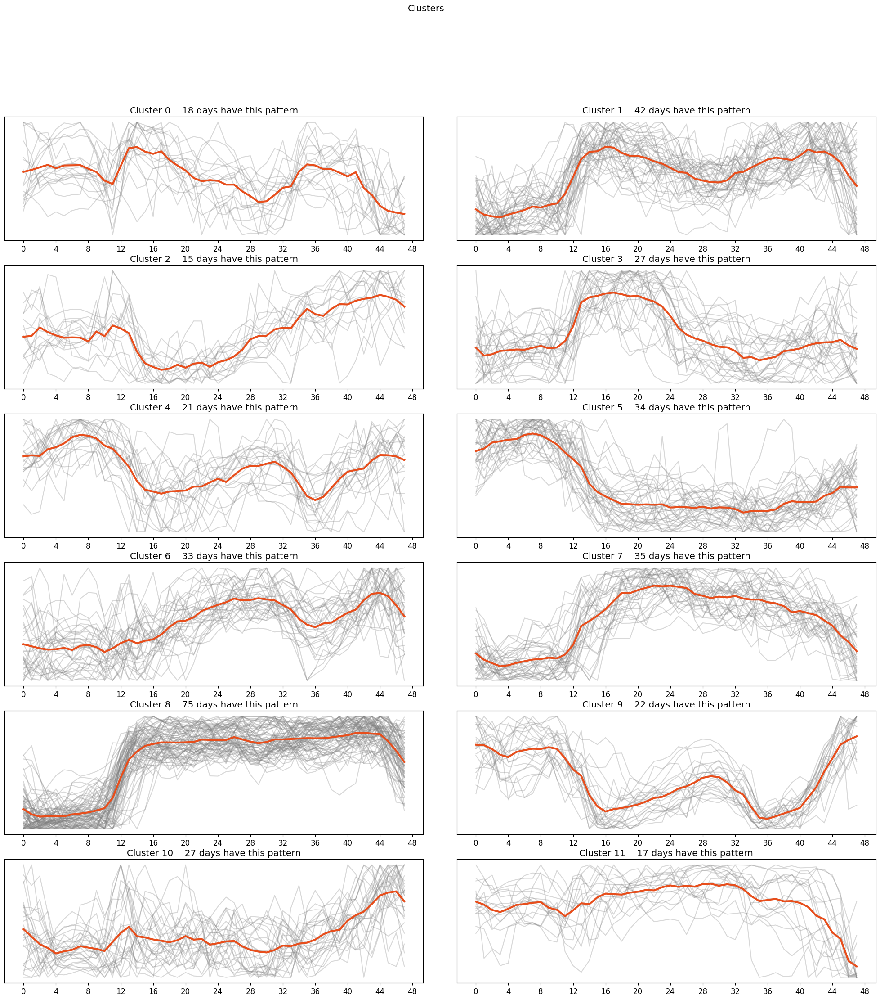

In [25]:
plot_cluster(df2020_srs,labels_2020)

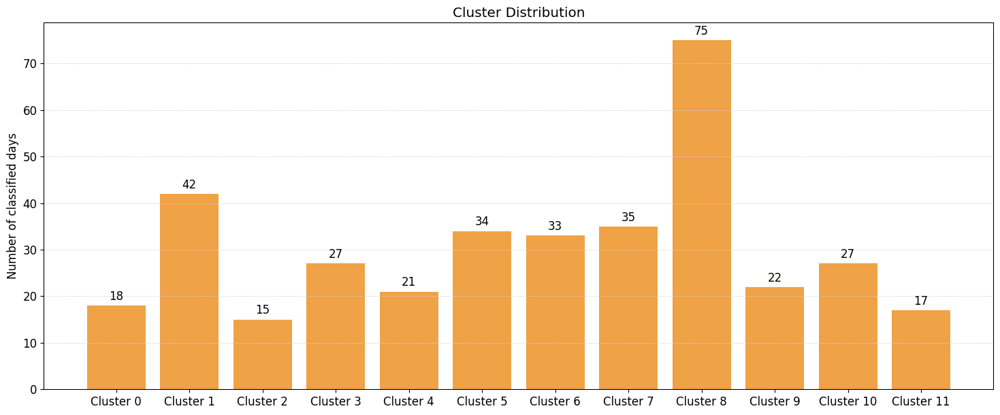

In [26]:
plot_c_distr(labels_2020)

### Year 2019 Clustering Visualisation

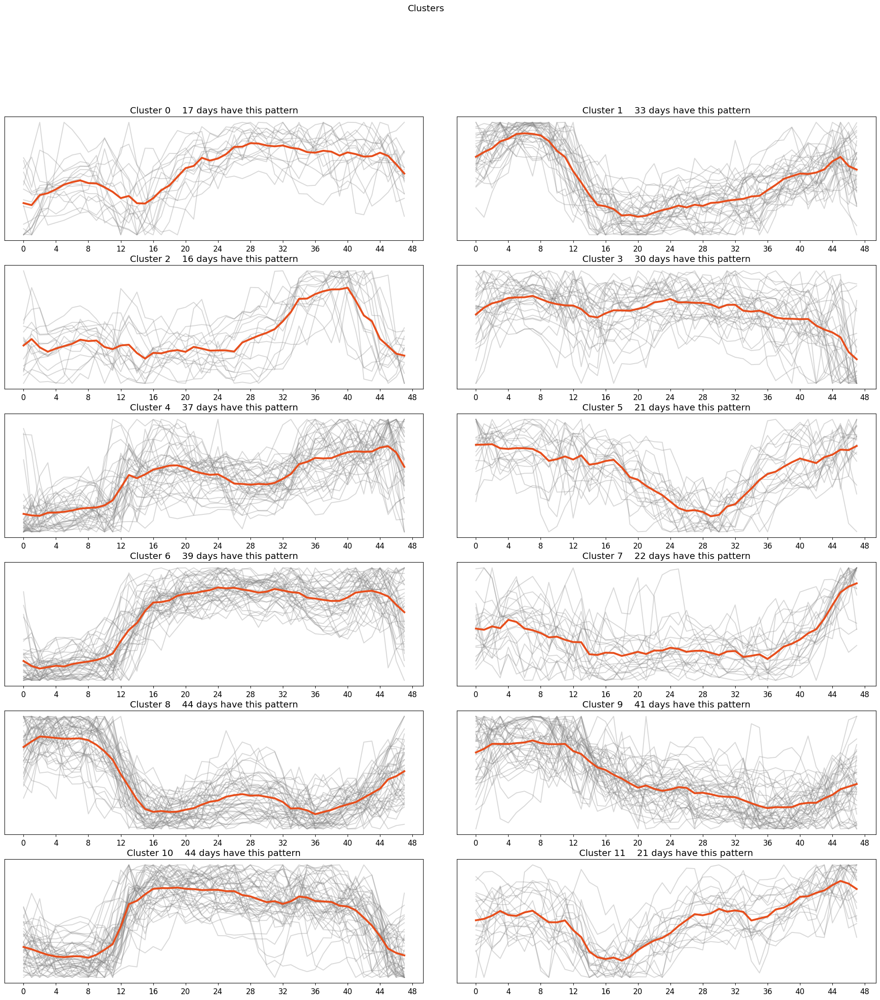

In [27]:
plot_cluster(df2019_srs,labels_2019)

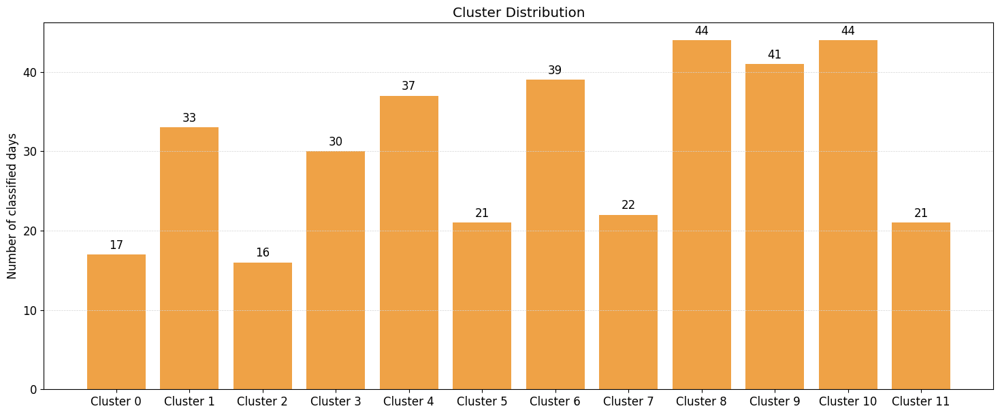

In [28]:
plot_c_distr(labels_2019)

### Year 2018 Clustering Visualisation

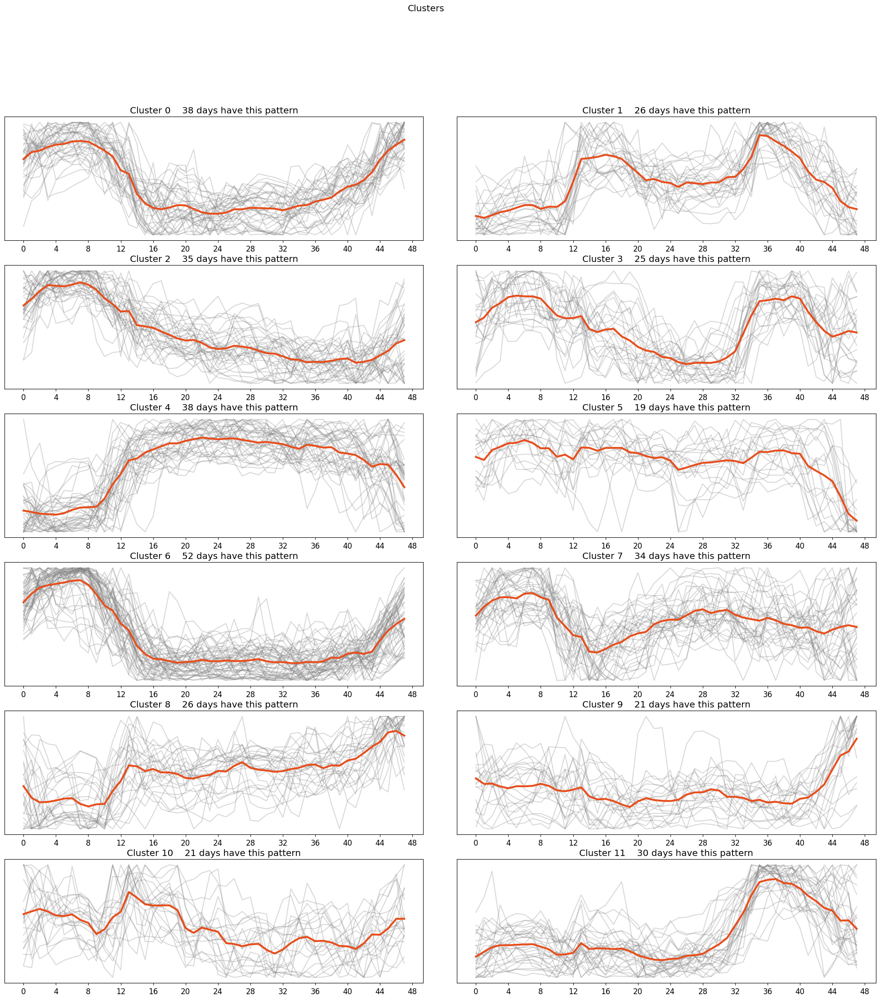

In [29]:
plot_cluster(df2018_srs,labels_2018)

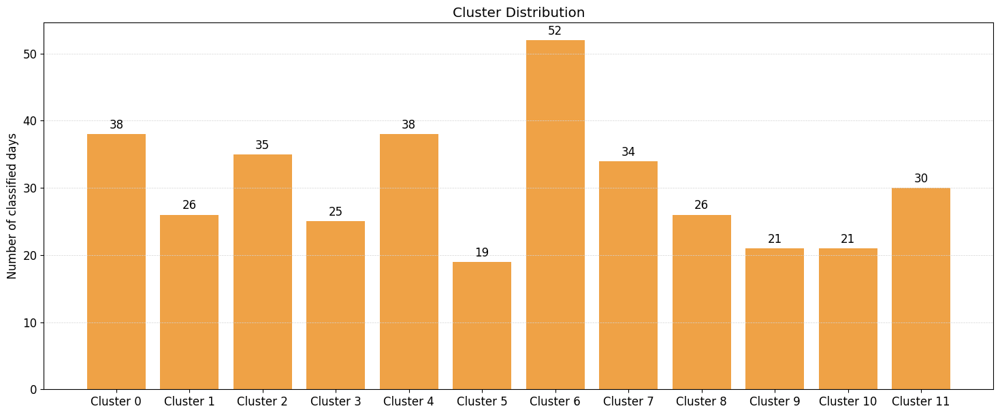

In [30]:
plot_c_distr(labels_2018)

### Year 2018 - 2022 Clustering Visualisation

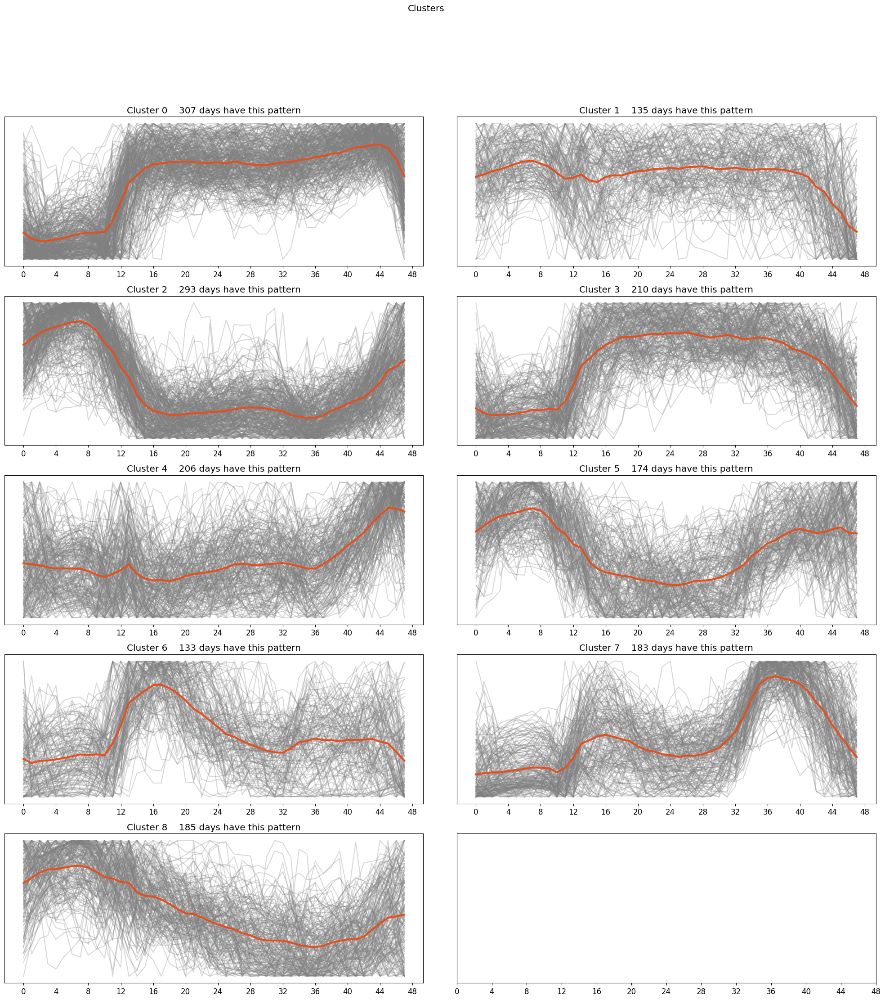

In [31]:
plot_cluster(df2018_2022_srs,labels_2018_2022)

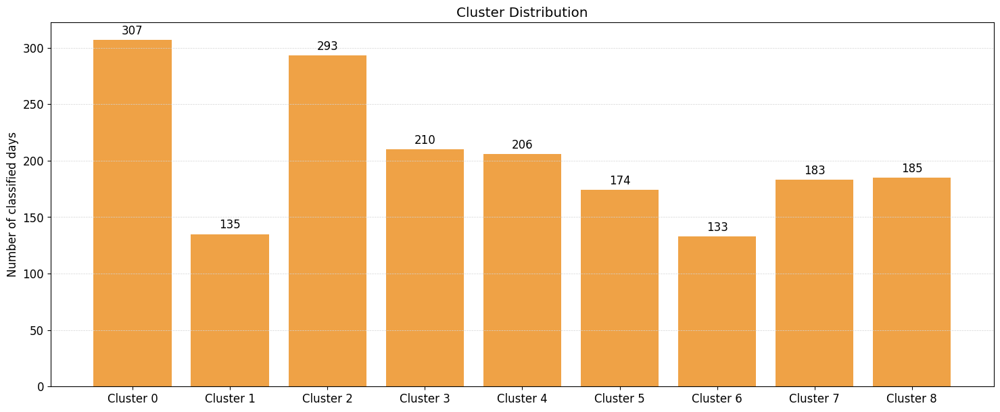

In [32]:
plot_c_distr(labels_2018_2022)

## Visualisation five years clustering in 3D

In [33]:
# Function to perform Principal Component Analysis
def series_pca3(series_name):
    pca = PCA(n_components=5)
    series = globals()[series_name+'_srs']
    globals()[series_name +'_pca3'] = pca.fit_transform(series)

# PCA all the series
for series_name in dfname_list:
    series_pca3(series_name)

In [36]:
labelnew = KMeans(n_clusters=9,max_iter=50000).fit_predict(df2018_2022_pca3)

<Figure size 800x800 with 0 Axes>

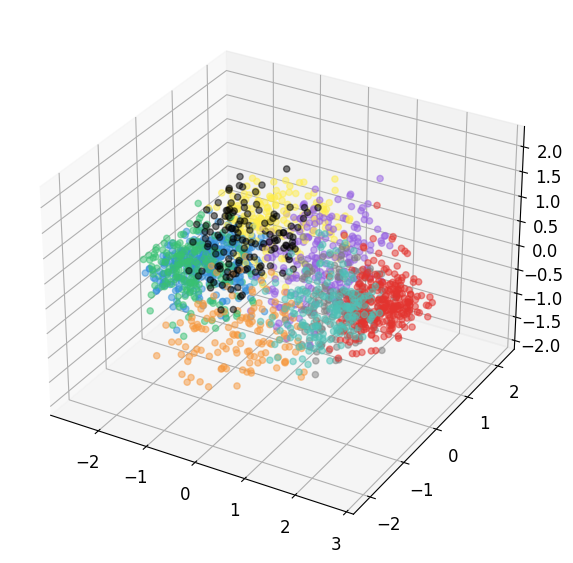

In [37]:
label_color_dict = {0:'gray',1:'black',2:'#e3342f',3:'#f6993f',4:'#ffed4a',5:'#38c172',6:'#4dc0b5',7:'#3490dc',8:'#9561e2'}

cvec = [label_color_dict[label] for label in labelnew]

plt.figure(figsize=(8,8))
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df2018_2022_pca3[:,0], df2018_2022_pca3[:,1],df2018_2022_pca3[:,2],
            c=cvec, alpha=0.5)